# Computer Vision Lab 3 - Image Filtering and Noise Removal
## Student ID: 2447218

This notebook demonstrates:
1. Image loading and color space conversion
2. Adding various types of noise (Gaussian, Salt, Pepper, Salt & Pepper)
3. Linear filters (Box/Average, Gaussian Blur)
4. Edge detection using Laplacian filter
5. Non-linear filters (Min, Max, Median) for noise removal


In [2]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import minimum_filter, maximum_filter

# Set matplotlib to display images inline
%matplotlib inline

# Set figure size for better visualization
plt.rcParams['figure.figsize'] = (15, 10)


## Task 1: Load the Image using cv2 Library


In [3]:
# Load the image using cv2
image_bgr = cv2.imread('sample.jpg')

if image_bgr is None:
    print("Error: Image not found!")
else:
    print(f"Image loaded successfully!")
    print(f"Image shape: {image_bgr.shape}")
    print(f"Image dtype: {image_bgr.dtype}")


Image loaded successfully!
Image shape: (800, 800, 3)
Image dtype: uint8


## Task 2: Convert BGR Image to RGB and Grayscale


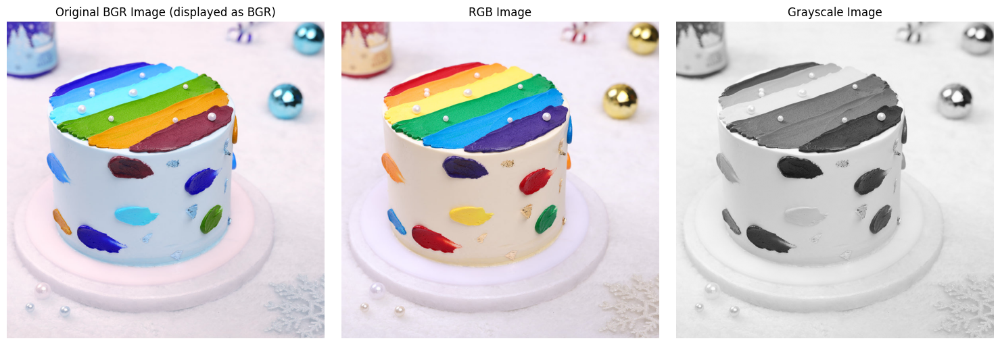

RGB Image shape: (800, 800, 3)
Grayscale Image shape: (800, 800)


In [4]:
# Convert BGR to RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Convert BGR to Grayscale
image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

# Display the images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(image_bgr)
axes[0].set_title('Original BGR Image (displayed as BGR)')
axes[0].axis('off')

axes[1].imshow(image_rgb)
axes[1].set_title('RGB Image')
axes[1].axis('off')

axes[2].imshow(image_gray, cmap='gray')
axes[2].set_title('Grayscale Image')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print(f"RGB Image shape: {image_rgb.shape}")
print(f"Grayscale Image shape: {image_gray.shape}")


## Task 3: Add Gaussian Noise with Various Densities


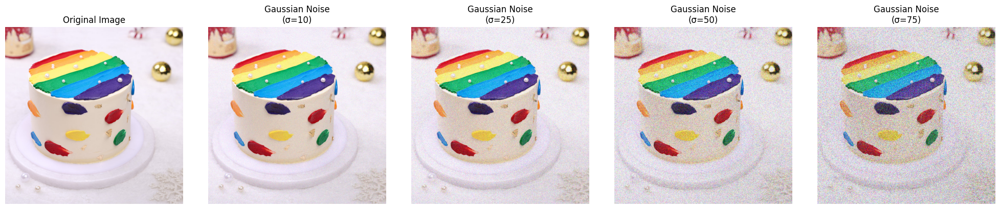

In [5]:
def add_gaussian_noise(image, mean=0, sigma=25):
    """
    Add Gaussian noise to an image
    
    Parameters:
    - image: input image
    - mean: mean of Gaussian distribution
    - sigma: standard deviation (controls noise intensity)
    
    Returns:
    - noisy image
    """
    gaussian_noise = np.random.normal(mean, sigma, image.shape)
    noisy_image = image.astype(np.float64) + gaussian_noise
    noisy_image = np.clip(noisy_image, 0, 255)
    return noisy_image.astype(np.uint8)

# Add Gaussian noise with various densities (different sigma values)
sigma_values = [10, 25, 50, 75]
noisy_images_gaussian = []

for sigma in sigma_values:
    noisy_img = add_gaussian_noise(image_rgb, sigma=sigma)
    noisy_images_gaussian.append(noisy_img)

# Display original and noisy images
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

axes[0].imshow(image_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

for i, (noisy_img, sigma) in enumerate(zip(noisy_images_gaussian, sigma_values)):
    axes[i+1].imshow(noisy_img)
    axes[i+1].set_title(f'Gaussian Noise\n(σ={sigma})')
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()


## Task 4: Apply Linear Filters

### i) Box Filter (Average Filter) with Different Mask Sizes


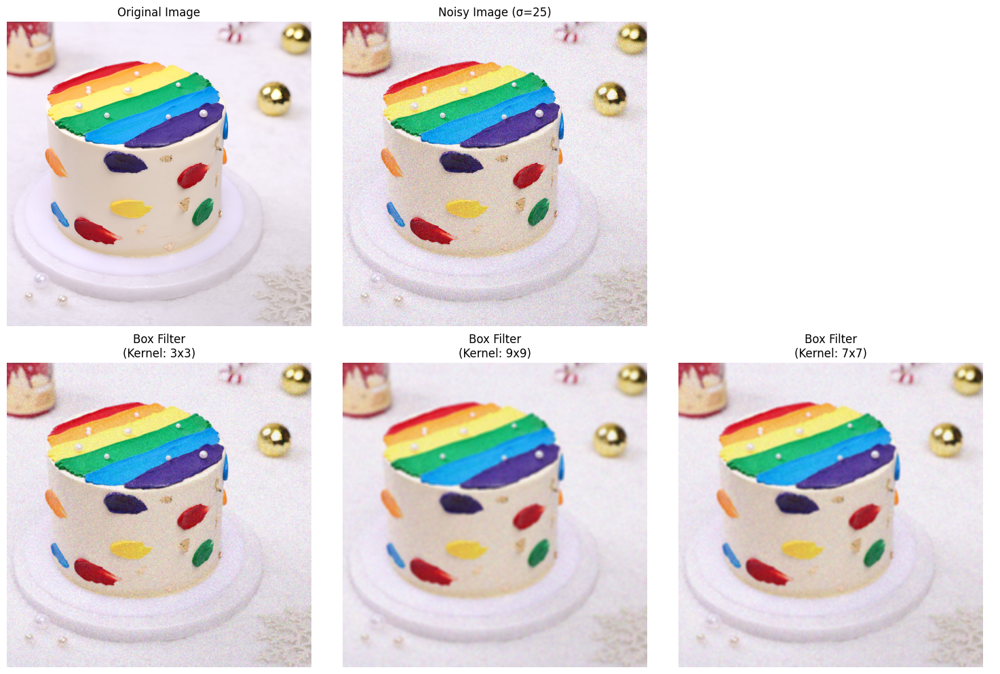

In [6]:
# Use image with moderate Gaussian noise (sigma=25)
noisy_image = noisy_images_gaussian[1]

# Apply Box/Average filter with different kernel sizes
kernel_sizes = [3, 5, 7, 9]
box_filtered_images = []

for kernel_size in kernel_sizes:
    filtered_img = cv2.blur(noisy_image, (kernel_size, kernel_size))
    box_filtered_images.append(filtered_img)

# Display results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(image_rgb)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(noisy_image)
axes[0, 1].set_title('Noisy Image (σ=25)')
axes[0, 1].axis('off')

axes[0, 2].axis('off')

for i, (filtered_img, kernel_size) in enumerate(zip(box_filtered_images, kernel_sizes)):
    row = 1 + i // 2
    col = i % 2
    if row < 2:
        axes[row, col].imshow(filtered_img)
        axes[row, col].set_title(f'Box Filter\n(Kernel: {kernel_size}x{kernel_size})')
        axes[row, col].axis('off')

if len(box_filtered_images) == 4:
    axes[1, 2].imshow(box_filtered_images[2])
    axes[1, 2].set_title(f'Box Filter\n(Kernel: 7x7)')
    axes[1, 2].axis('off')
    axes[1, 1].imshow(box_filtered_images[3])
    axes[1, 1].set_title(f'Box Filter\n(Kernel: 9x9)')
    axes[1, 1].axis('off')
    axes[1, 0].imshow(box_filtered_images[0])
    axes[1, 0].set_title(f'Box Filter\n(Kernel: 3x3)')
    axes[1, 0].axis('off')

plt.tight_layout()
plt.show()


### ii) Gaussian Blur Filter with Different Mask Sizes


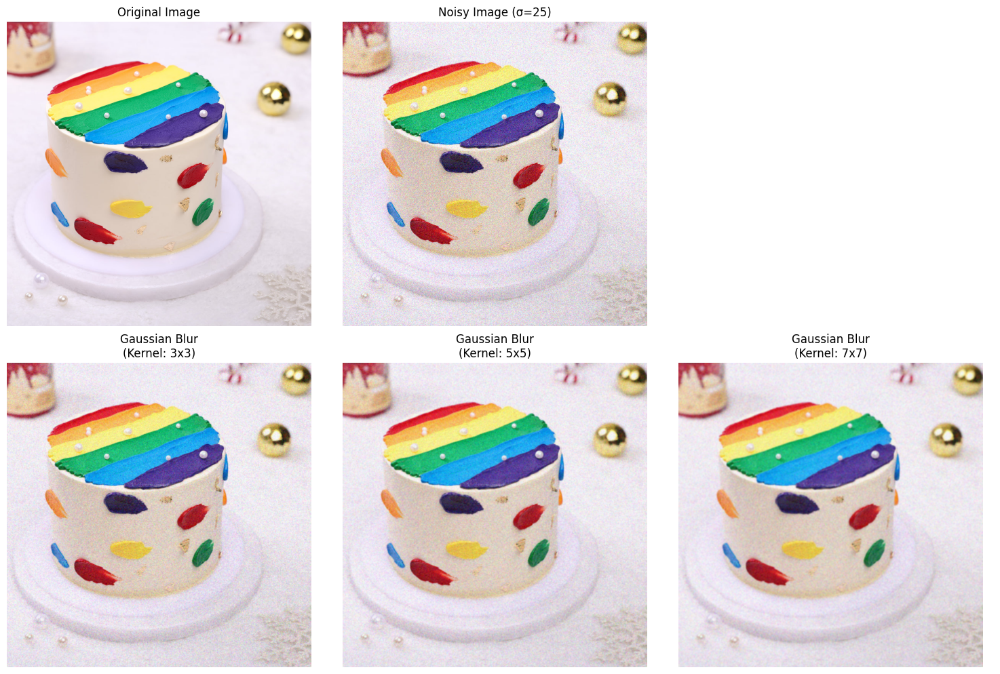

In [7]:
# Apply Gaussian Blur filter with different kernel sizes
kernel_sizes_gaussian = [3, 5, 7, 9]
gaussian_filtered_images = []

for kernel_size in kernel_sizes_gaussian:
    # Kernel size must be odd and positive
    filtered_img = cv2.GaussianBlur(noisy_image, (kernel_size, kernel_size), 0)
    gaussian_filtered_images.append(filtered_img)

# Display results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(image_rgb)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(noisy_image)
axes[0, 1].set_title('Noisy Image (σ=25)')
axes[0, 1].axis('off')

axes[0, 2].axis('off')

for i, (filtered_img, kernel_size) in enumerate(zip(gaussian_filtered_images, kernel_sizes_gaussian)):
    row = 1 + i // 2
    col = i % 2
    if row < 2 or col < 2:
        idx = 1 if row == 1 else 0
        if i == 0:
            axes[1, 0].imshow(filtered_img)
            axes[1, 0].set_title(f'Gaussian Blur\n(Kernel: {kernel_size}x{kernel_size})')
            axes[1, 0].axis('off')
        elif i == 1:
            axes[1, 1].imshow(filtered_img)
            axes[1, 1].set_title(f'Gaussian Blur\n(Kernel: {kernel_size}x{kernel_size})')
            axes[1, 1].axis('off')
        elif i == 2:
            axes[1, 2].imshow(filtered_img)
            axes[1, 2].set_title(f'Gaussian Blur\n(Kernel: {kernel_size}x{kernel_size})')
            axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


### Comparison: Box Filter vs Gaussian Blur


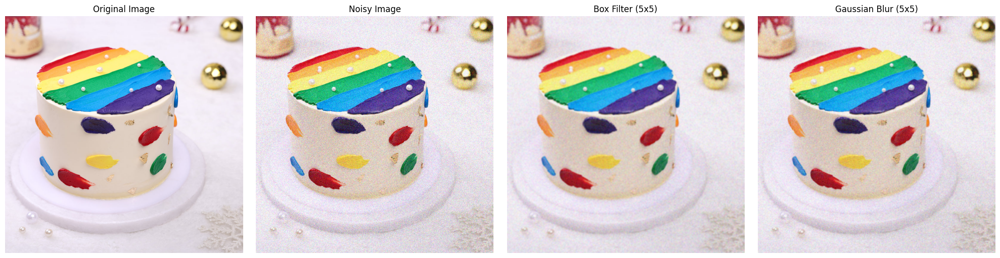

Note: Gaussian blur preserves edges better than box filter while removing noise.


In [8]:
# Compare Box filter and Gaussian blur with same kernel size
kernel_size = 5

box_filtered = cv2.blur(noisy_image, (kernel_size, kernel_size))
gaussian_filtered = cv2.GaussianBlur(noisy_image, (kernel_size, kernel_size), 0)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(image_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(noisy_image)
axes[1].set_title('Noisy Image')
axes[1].axis('off')

axes[2].imshow(box_filtered)
axes[2].set_title(f'Box Filter ({kernel_size}x{kernel_size})')
axes[2].axis('off')

axes[3].imshow(gaussian_filtered)
axes[3].set_title(f'Gaussian Blur ({kernel_size}x{kernel_size})')
axes[3].axis('off')

plt.tight_layout()
plt.show()

print("Note: Gaussian blur preserves edges better than box filter while removing noise.")


## Task 5: Apply Laplacian Filter to Grayscale Image for Edge Detection


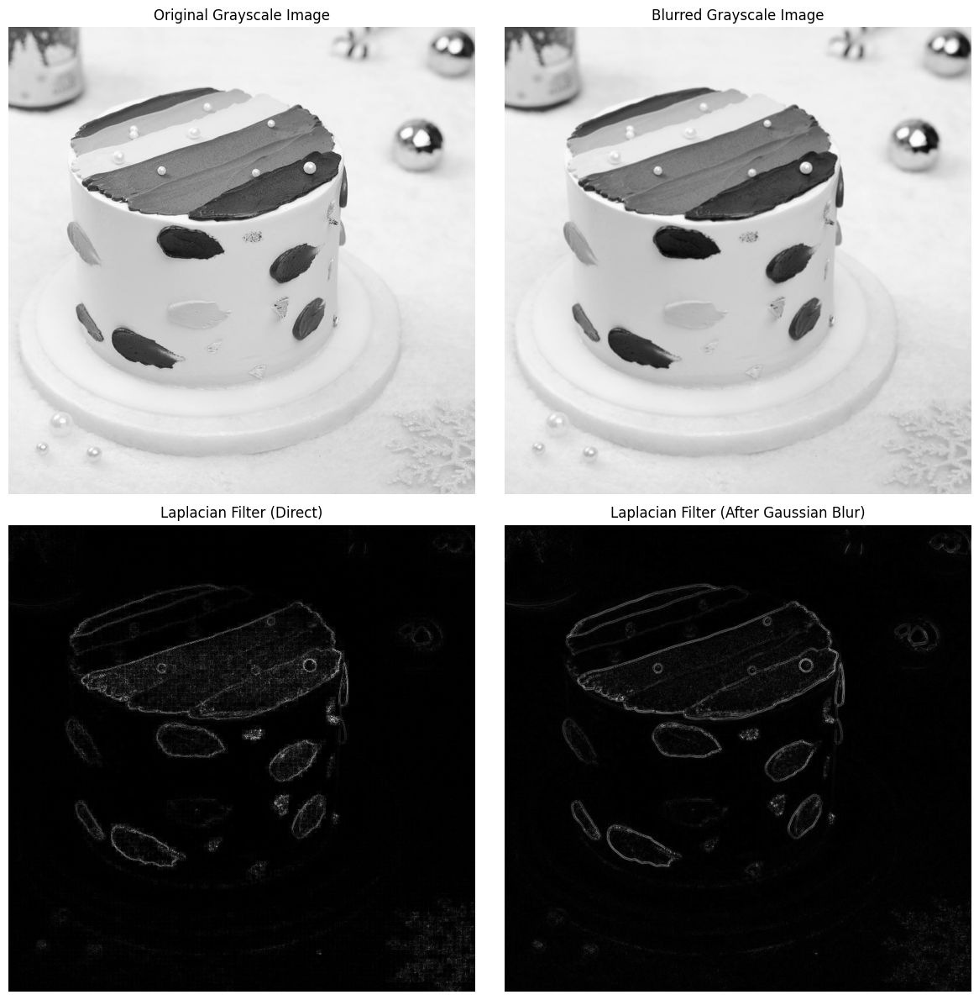

Laplacian filter highlights edges and regions of rapid intensity change.


In [9]:
# Apply Laplacian filter to grayscale image
# First, apply Gaussian blur to reduce noise (optional but recommended)
gray_blurred = cv2.GaussianBlur(image_gray, (3, 3), 0)

# Apply Laplacian filter
laplacian = cv2.Laplacian(gray_blurred, cv2.CV_64F)
laplacian_abs = np.absolute(laplacian)
laplacian_8u = np.uint8(laplacian_abs)

# Apply Laplacian without blurring for comparison
laplacian_direct = cv2.Laplacian(image_gray, cv2.CV_64F)
laplacian_direct_abs = np.absolute(laplacian_direct)
laplacian_direct_8u = np.uint8(laplacian_direct_abs)

# Display results
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

axes[0, 0].imshow(image_gray, cmap='gray')
axes[0, 0].set_title('Original Grayscale Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(gray_blurred, cmap='gray')
axes[0, 1].set_title('Blurred Grayscale Image')
axes[0, 1].axis('off')

axes[1, 0].imshow(laplacian_direct_8u, cmap='gray')
axes[1, 0].set_title('Laplacian Filter (Direct)')
axes[1, 0].axis('off')

axes[1, 1].imshow(laplacian_8u, cmap='gray')
axes[1, 1].set_title('Laplacian Filter (After Gaussian Blur)')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

print("Laplacian filter highlights edges and regions of rapid intensity change.")


## Task 6: Add Salt Noise and Apply Min Filter


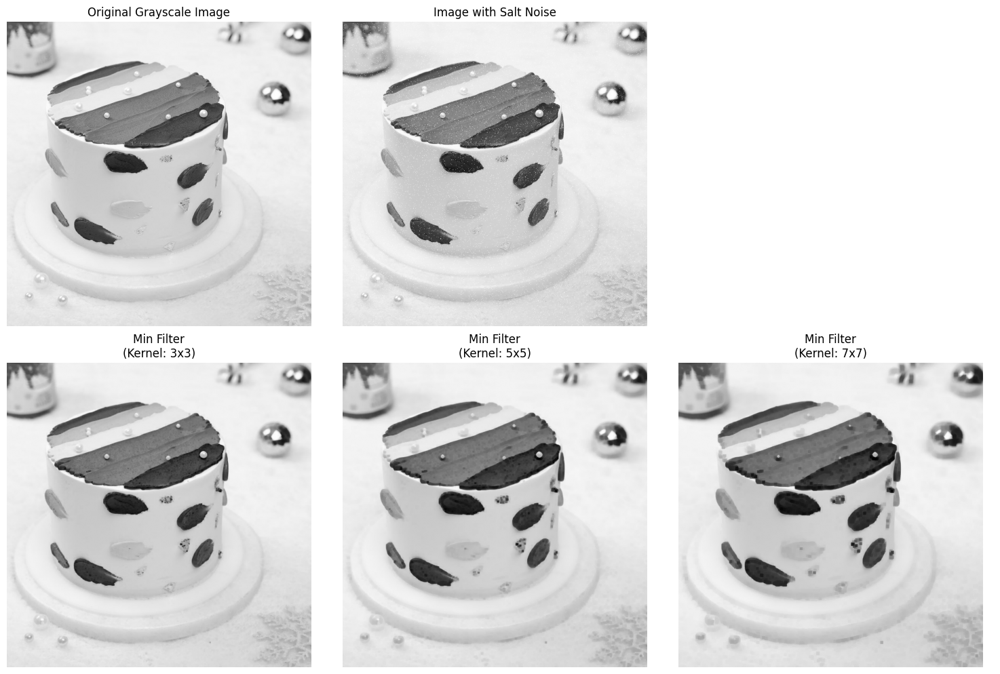

Min filter effectively removes salt noise (bright spots) by replacing each pixel with the minimum value in its neighborhood.


In [10]:
def add_salt_noise(image, salt_prob=0.02):
    """
    Add salt noise (white pixels) to an image
    
    Parameters:
    - image: input image
    - salt_prob: probability of salt noise
    
    Returns:
    - noisy image
    """
    noisy_image = image.copy()
    # Generate random matrix
    random_matrix = np.random.rand(*image.shape)
    # Add salt noise (white pixels = 255)
    noisy_image[random_matrix < salt_prob] = 255
    return noisy_image

# Add salt noise to grayscale image
salt_noisy_image = add_salt_noise(image_gray, salt_prob=0.02)

# Apply Min filter with different kernel sizes
kernel_sizes = [3, 5, 7]
min_filtered_images = []

for kernel_size in kernel_sizes:
    filtered_img = minimum_filter(salt_noisy_image, size=kernel_size)
    min_filtered_images.append(filtered_img)

# Display results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(image_gray, cmap='gray')
axes[0, 0].set_title('Original Grayscale Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(salt_noisy_image, cmap='gray')
axes[0, 1].set_title('Image with Salt Noise')
axes[0, 1].axis('off')

axes[0, 2].axis('off')

for i, (filtered_img, kernel_size) in enumerate(zip(min_filtered_images, kernel_sizes)):
    row = 1
    col = i
    axes[row, col].imshow(filtered_img, cmap='gray')
    axes[row, col].set_title(f'Min Filter\n(Kernel: {kernel_size}x{kernel_size})')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

print("Min filter effectively removes salt noise (bright spots) by replacing each pixel with the minimum value in its neighborhood.")


## Task 7: Add Pepper Noise and Apply Max Filter


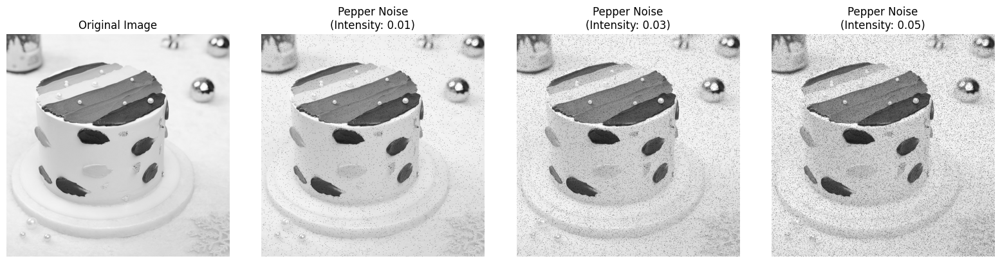

In [11]:
def add_pepper_noise(image, pepper_prob=0.02):
    """
    Add pepper noise (black pixels) to an image
    
    Parameters:
    - image: input image
    - pepper_prob: probability of pepper noise
    
    Returns:
    - noisy image
    """
    noisy_image = image.copy()
    # Generate random matrix
    random_matrix = np.random.rand(*image.shape)
    # Add pepper noise (black pixels = 0)
    noisy_image[random_matrix < pepper_prob] = 0
    return noisy_image

# Add pepper noise with various intensities
pepper_intensities = [0.01, 0.03, 0.05]
pepper_noisy_images = []

for intensity in pepper_intensities:
    pepper_noisy = add_pepper_noise(image_gray, pepper_prob=intensity)
    pepper_noisy_images.append(pepper_noisy)

# Display pepper noise with various intensities
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

for i, (noisy_img, intensity) in enumerate(zip(pepper_noisy_images, pepper_intensities)):
    axes[i+1].imshow(noisy_img, cmap='gray')
    axes[i+1].set_title(f'Pepper Noise\n(Intensity: {intensity})')
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()


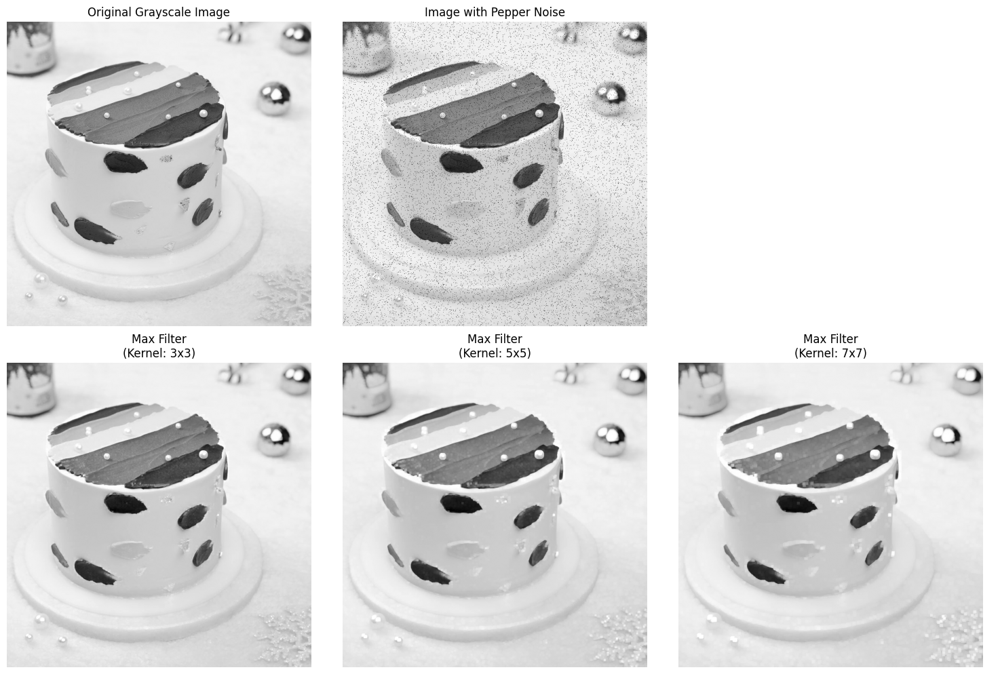

Max filter effectively removes pepper noise (dark spots) by replacing each pixel with the maximum value in its neighborhood.


In [12]:
# Use pepper noise with moderate intensity
pepper_noisy_image = pepper_noisy_images[1]  # intensity = 0.03

# Apply Max filter with different kernel sizes
kernel_sizes = [3, 5, 7]
max_filtered_images = []

for kernel_size in kernel_sizes:
    filtered_img = maximum_filter(pepper_noisy_image, size=kernel_size)
    max_filtered_images.append(filtered_img)

# Display results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(image_gray, cmap='gray')
axes[0, 0].set_title('Original Grayscale Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(pepper_noisy_image, cmap='gray')
axes[0, 1].set_title('Image with Pepper Noise')
axes[0, 1].axis('off')

axes[0, 2].axis('off')

for i, (filtered_img, kernel_size) in enumerate(zip(max_filtered_images, kernel_sizes)):
    row = 1
    col = i
    axes[row, col].imshow(filtered_img, cmap='gray')
    axes[row, col].set_title(f'Max Filter\n(Kernel: {kernel_size}x{kernel_size})')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

print("Max filter effectively removes pepper noise (dark spots) by replacing each pixel with the maximum value in its neighborhood.")


## Task 8: Add Salt and Pepper Noise and Apply Median Filter


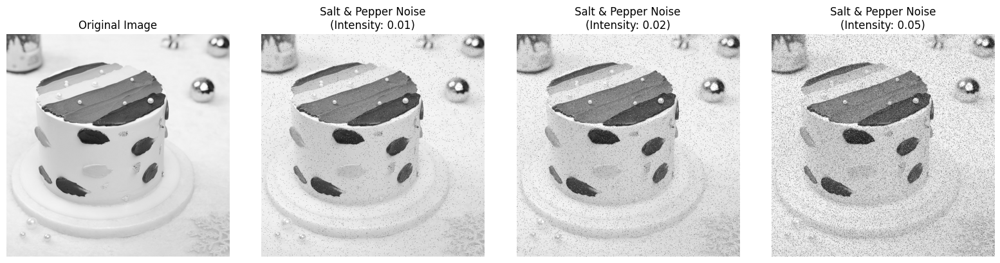

In [13]:
def add_salt_and_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    """
    Add salt and pepper noise to an image
    
    Parameters:
    - image: input image
    - salt_prob: probability of salt noise
    - pepper_prob: probability of pepper noise
    
    Returns:
    - noisy image
    """
    noisy_image = image.copy()
    # Generate random matrix
    random_matrix = np.random.rand(*image.shape)
    
    # Add salt noise (white pixels = 255)
    noisy_image[random_matrix < salt_prob] = 255
    
    # Add pepper noise (black pixels = 0)
    noisy_image[random_matrix > (1 - pepper_prob)] = 0
    
    return noisy_image

# Add salt and pepper noise with various intensities
noise_intensities = [(0.01, 0.01), (0.02, 0.02), (0.05, 0.05)]
sp_noisy_images = []

for salt_prob, pepper_prob in noise_intensities:
    sp_noisy = add_salt_and_pepper_noise(image_gray, salt_prob, pepper_prob)
    sp_noisy_images.append(sp_noisy)

# Display salt and pepper noise with various intensities
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

for i, (noisy_img, (salt_prob, pepper_prob)) in enumerate(zip(sp_noisy_images, noise_intensities)):
    axes[i+1].imshow(noisy_img, cmap='gray')
    axes[i+1].set_title(f'Salt & Pepper Noise\n(Intensity: {salt_prob})')
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()


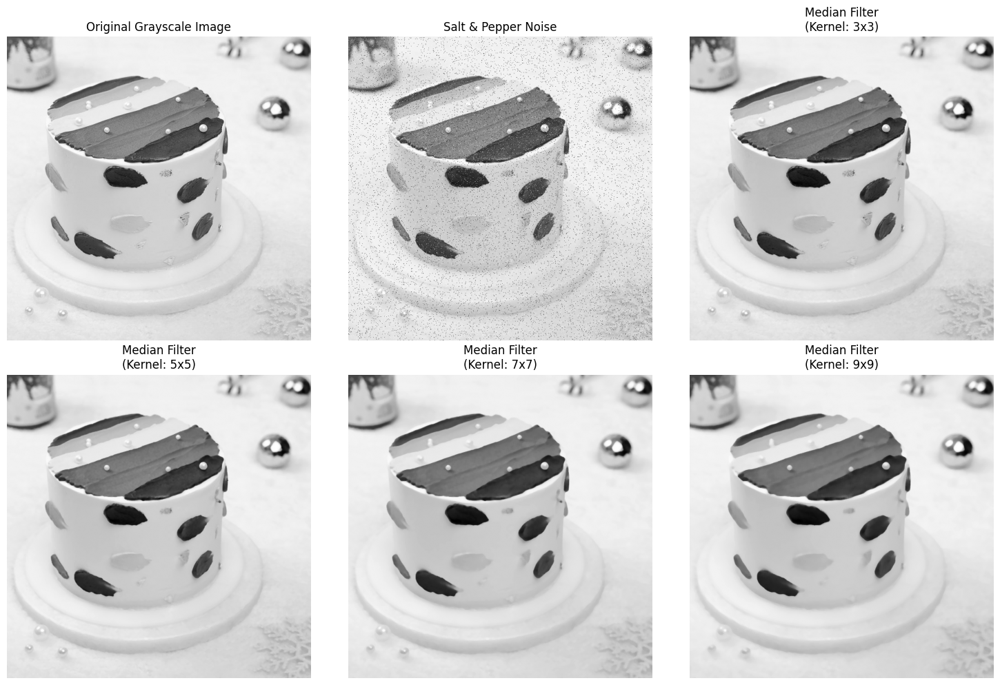

Median filter is highly effective for removing salt and pepper noise while preserving edges.


In [14]:
# Use salt and pepper noise with moderate intensity
sp_noisy_image = sp_noisy_images[1]  # intensity = 0.02

# Apply Median filter with different kernel sizes
kernel_sizes = [3, 5, 7, 9]
median_filtered_images = []

for kernel_size in kernel_sizes:
    filtered_img = cv2.medianBlur(sp_noisy_image, kernel_size)
    median_filtered_images.append(filtered_img)

# Display results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(image_gray, cmap='gray')
axes[0, 0].set_title('Original Grayscale Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(sp_noisy_image, cmap='gray')
axes[0, 1].set_title('Salt & Pepper Noise')
axes[0, 1].axis('off')

axes[0, 2].imshow(median_filtered_images[0], cmap='gray')
axes[0, 2].set_title(f'Median Filter\n(Kernel: 3x3)')
axes[0, 2].axis('off')

axes[1, 0].imshow(median_filtered_images[1], cmap='gray')
axes[1, 0].set_title(f'Median Filter\n(Kernel: 5x5)')
axes[1, 0].axis('off')

axes[1, 1].imshow(median_filtered_images[2], cmap='gray')
axes[1, 1].set_title(f'Median Filter\n(Kernel: 7x7)')
axes[1, 1].axis('off')

axes[1, 2].imshow(median_filtered_images[3], cmap='gray')
axes[1, 2].set_title(f'Median Filter\n(Kernel: 9x9)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("Median filter is highly effective for removing salt and pepper noise while preserving edges.")


## Comparison of Different Filters for Salt & Pepper Noise Removal


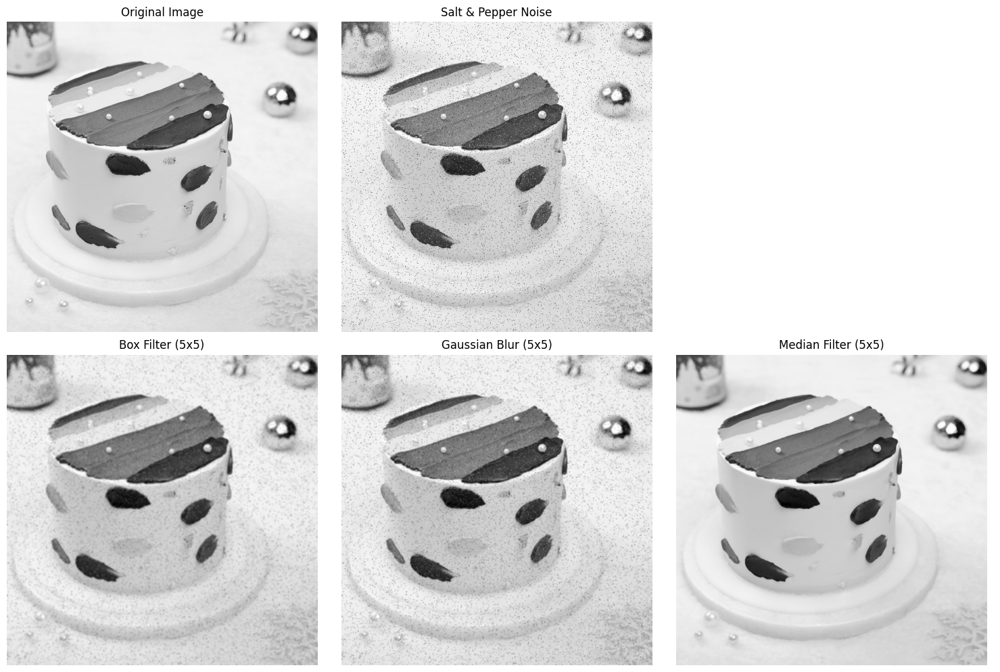


Observations:
1. Box filter and Gaussian blur create blurry results and don't effectively remove impulse noise.
2. Median filter provides the best results for salt & pepper noise removal.
3. Median filter preserves edges better than linear filters.


In [15]:
# Compare different filters for salt and pepper noise removal
kernel_size = 5

# Apply different filters
box_filtered_sp = cv2.blur(sp_noisy_image, (kernel_size, kernel_size))
gaussian_filtered_sp = cv2.GaussianBlur(sp_noisy_image, (kernel_size, kernel_size), 0)
median_filtered_sp = cv2.medianBlur(sp_noisy_image, kernel_size)

# Display comparison
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(image_gray, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(sp_noisy_image, cmap='gray')
axes[0, 1].set_title('Salt & Pepper Noise')
axes[0, 1].axis('off')

axes[0, 2].axis('off')

axes[1, 0].imshow(box_filtered_sp, cmap='gray')
axes[1, 0].set_title(f'Box Filter ({kernel_size}x{kernel_size})')
axes[1, 0].axis('off')

axes[1, 1].imshow(gaussian_filtered_sp, cmap='gray')
axes[1, 1].set_title(f'Gaussian Blur ({kernel_size}x{kernel_size})')
axes[1, 1].axis('off')

axes[1, 2].imshow(median_filtered_sp, cmap='gray')
axes[1, 2].set_title(f'Median Filter ({kernel_size}x{kernel_size})')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("\nObservations:")
print("1. Box filter and Gaussian blur create blurry results and don't effectively remove impulse noise.")
print("2. Median filter provides the best results for salt & pepper noise removal.")
print("3. Median filter preserves edges better than linear filters.")


## Summary and Conclusions

### Key Findings:

1. **Gaussian Noise**: Best removed using linear filters (Box/Average or Gaussian Blur)
   - Gaussian blur preserves edges better than box filter
   - Larger kernel sizes provide more smoothing but also more blurring

2. **Salt Noise (White spots)**: Best removed using Min filter
   - Min filter replaces pixels with minimum neighborhood value
   - Effective for bright impulse noise

3. **Pepper Noise (Black spots)**: Best removed using Max filter
   - Max filter replaces pixels with maximum neighborhood value
   - Effective for dark impulse noise

4. **Salt & Pepper Noise**: Best removed using Median filter
   - Median filter is a non-linear filter that preserves edges
   - More effective than linear filters for impulse noise
   - Optimal kernel size depends on noise density

5. **Edge Detection**: Laplacian filter effectively highlights edges
   - Works on second derivative of image intensity
   - Pre-smoothing with Gaussian blur reduces noise sensitivity

### Filter Selection Guide:
- **Gaussian/Random Noise** → Gaussian Blur or Box Filter
- **Salt Noise** → Min Filter
- **Pepper Noise** → Max Filter
- **Salt & Pepper Noise** → Median Filter
- **Edge Detection** → Laplacian (with pre-smoothing)
